In [1]:
import os
import random
import warnings
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoImageProcessor, DeformableDetrForObjectDetection
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

warnings.filterwarnings("ignore", message=".*copying from a non-meta parameter.*")
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.mps.is_available() else "cpu"
)
print(device)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

model_save_dir = "detr_models"
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

2025-04-28 05:22:21.650806: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745817741.869489      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745817741.936911      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


cuda


In [2]:
class FoggyCityscapesDataset(Dataset):
    def __init__(self, root, annotations_path, processor):
        self.root = root
        self.coco_annotations = COCO(annotations_path)
        self.processor = processor
        self.img_ids = list(self.coco_annotations.imgs.keys())
        self.img_to_path = {
            id: os.path.join(root, self.coco_annotations.loadImgs(id)[0]["file_name"])
            for id in self.img_ids
        }

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        image_id = self.img_ids[idx]
        path = self.img_to_path[image_id]
        image = np.array(Image.open(path).convert("RGB"))
        processed = {}
        processed["image_id"] = image_id
        processed["orig_image"] = image
        processed["processed_img"] = self.processor(
            images=np.array(image), return_tensors="pt"
        )["pixel_values"].squeeze(0)

        return processed

In [3]:
def plot_predictions(orig_image, gt, output, id_to_cat):
    orig_image_cpu = orig_image.detach().cpu()

    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    axs[0].imshow(orig_image_cpu)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(orig_image_cpu)
    axs[1].set_title("Ground Truth Boxes")
    axs[1].axis("off")
    for label, box in zip(gt["labels"], gt["boxes"]):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="green",
            facecolor="none",
        )
        axs[1].add_patch(rect)
        axs[1].text(
            xmin,
            ymin - 5,
            f"GT: {id_to_cat[label]}",
            fontsize=10,
            color="blue",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    axs[2].imshow(orig_image)
    axs[2].set_title("Predicted Boxes")
    axs[2].axis("off")

    for score, label, box in zip(output["scores"], output["labels"], output["boxes"]):
        score = score.detach().cpu()
        label = label.detach().cpu()
        box = box.detach().cpu()

        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        axs[2].add_patch(rect)
        axs[2].text(
            xmin,
            ymin - 5,
            f"{id_to_cat[label.item()]}: {round(score.item(), 2)}",
            fontsize=10,
            color="red",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    plt.tight_layout()
    plt.show()

In [4]:
def remap_and_filter_predictions(pred_dict, label_map):
    labels = pred_dict["labels"]
    keep_indices = torch.tensor(
        [i for i, label in enumerate(labels.tolist()) if label in label_map],
        device=labels.device,
        dtype=torch.long,
    )

    if keep_indices.numel() == 0:
        return {
            "scores": torch.empty(
                0, device=labels.device, dtype=pred_dict["scores"].dtype
            ),
            "labels": torch.empty(0, device=labels.device, dtype=torch.long),
            "boxes": torch.empty(
                (0, 4), device=labels.device, dtype=pred_dict["boxes"].dtype
            ),
        }

    filtered_scores = pred_dict["scores"][keep_indices]
    filtered_labels = pred_dict["labels"][keep_indices]
    filtered_boxes = pred_dict["boxes"][keep_indices]

    remapped_labels = torch.tensor(
        [label_map[int(label.item())] for label in filtered_labels],
        device=filtered_labels.device,
    )

    return {
        "scores": filtered_scores,
        "labels": remapped_labels,
        "boxes": filtered_boxes,
    }

In [5]:
def summarise_and_plot_metrics(coco, coco_dt, save_dir):
    coco_eval = COCOeval(coco, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()

    os.makedirs(save_dir, exist_ok=True)

    print("\n### COCO Evaluation Summary ###")
    coco_eval.summarize()

    overall_metrics = {
        "AP@[IoU=0.50:0.95]": coco_eval.stats[0],
        "AP@0.50": coco_eval.stats[1],
        "AP@0.75": coco_eval.stats[2],
        "AP (small)": coco_eval.stats[3],
        "AP (medium)": coco_eval.stats[4],
        "AP (large)": coco_eval.stats[5],
        "AR@1": coco_eval.stats[6],
        "AR@10": coco_eval.stats[7],
        "AR@100": coco_eval.stats[8],
        "AR (small)": coco_eval.stats[9],
        "AR (medium)": coco_eval.stats[10],
        "AR (large)": coco_eval.stats[11],
    }

    print("\n### Overall COCO Evaluation Metrics ###")
    for metric, value in overall_metrics.items():
        print(f"{metric:20s}: {value:.3f}")

    pd.DataFrame([overall_metrics]).to_csv(
        os.path.join(save_dir, "overall_metrics.csv"), index=False
    )

    precisions = coco_eval.eval["precision"]
    recall_vals = coco_eval.params.recThrs
    cat_ids = coco.getCatIds()

    full_metrics = []
    all_pr_tables = []
    overall_pr = []

    print("\n### Per-Class AP Metrics ###")
    for idx, catId in enumerate(cat_ids):
        class_metrics = {}
        cat_name = coco.loadCats(catId)[0]["name"]
        class_metrics["category"] = cat_name

        p50 = precisions[0, :, idx, 0, 2]
        p50 = p50[p50 > -1]
        class_metrics["AP@0.50"] = np.mean(p50) if p50.size else float("nan")

        p75 = precisions[5, :, idx, 0, 2]
        p75 = p75[p75 > -1]
        class_metrics["AP@0.75"] = np.mean(p75) if p75.size else float("nan")

        p_all = precisions[:, :, idx, 0, 2]
        p_all = p_all[p_all > -1]
        class_metrics["mAP@[.5:.95]"] = np.mean(p_all) if p_all.size else float("nan")

        full_metrics.append(class_metrics)

        print(
            f"{cat_name:20s} | AP@0.5: {class_metrics['AP@0.50']:.3f} | "
            f"AP@0.75: {class_metrics['AP@0.75']:.3f} | "
            f"mAP@[.5:.95]: {class_metrics['mAP@[.5:.95]']:.3f}"
        )

        pr_curve = precisions[0, :, idx, 0, 2]
        if np.any(pr_curve > -1):
            overall_pr.append(np.where(pr_curve == -1, 0, pr_curve))

        # Collect PR table data
        for r, p in zip(recall_vals, pr_curve):
            if p > -1:
                all_pr_tables.append(
                    {"category": cat_name, "recall": r, "precision": p}
                )

        # Plot PR curve for this class
        valid = pr_curve > -1
        plt.figure()
        plt.plot(
            recall_vals[valid],
            pr_curve[valid],
            label=f"PR Curve - {cat_name}",
            color="blue",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"PR Curve @ IoU=0.5 for {cat_name}")
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, f"pr_curve_{cat_name.replace(' ', '_')}.png")
        )
        plt.show()
        plt.close()

    # Save per-class metrics
    df_metrics = pd.DataFrame(full_metrics)
    df_metrics.to_csv(os.path.join(save_dir, "per_class_metrics.csv"), index=False)

    # Plot mAP per class bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(df_metrics["category"], df_metrics["mAP@[.5:.95]"], color="skyblue")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("mAP@[.5:.95]")
    plt.title("Mean Average Precision per Class")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "mAP_per_class.png"))
    plt.show()
    plt.close()

    # Save full precision-recall table to CSV
    pr_df = pd.DataFrame(all_pr_tables)
    pr_df.to_csv(os.path.join(save_dir, "precision_recall_table.csv"), index=False)

    # Overall PR Curve
    if overall_pr:
        overall_pr_array = np.array(overall_pr)
        mean_pr_curve = np.mean(overall_pr_array, axis=0)

        # Plot overall PR curve
        plt.figure(figsize=(8, 6))
        plt.plot(
            recall_vals,
            mean_pr_curve,
            color="darkorange",
            label="Overall PR Curve (IoU=0.5)",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Overall Precision-Recall Curve @ IoU=0.5")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, "overall_pr_curve.png"))
        plt.show()
        plt.close()

        # Plot PR curves for all classes in one figure
        plt.figure(figsize=(10, 7))
        for idx, pr_curve in enumerate(overall_pr_array):
            cat_name = coco.loadCats(cat_ids[idx])[0]["name"]
            valid = pr_curve > -1
            plt.plot(recall_vals[valid], pr_curve[valid], label=cat_name, linewidth=1.5)
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("PR Curves for All Classes @ IoU=0.5")
        plt.legend(
            loc="best", fontsize="small", bbox_to_anchor=(1.05, 1), borderaxespad=0.0
        )
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, "all_classes_pr_curve.png"), bbox_inches="tight"
        )
        plt.show()
        plt.close()

    # Plot AP@0.50 and AP@0.75 side-by-side per class
    plt.figure(figsize=(14, 6))
    x = np.arange(len(df_metrics))
    width = 0.35

    plt.bar(
        x - width / 2, df_metrics["AP@0.50"], width, label="AP@0.50", color="lightgreen"
    )
    plt.bar(
        x + width / 2, df_metrics["AP@0.75"], width, label="AP@0.75", color="salmon"
    )

    plt.xticks(ticks=x, labels=df_metrics["category"], rotation=45, ha="right")
    plt.ylabel("Average Precision")
    plt.title("AP@0.50 vs AP@0.75 per Class")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP50_vs_AP75_per_class.png"))
    plt.show()
    plt.close()

    # Object-size AP bar chart
    size_ap_labels = ["small", "medium", "large"]
    size_ap_values = [
        overall_metrics["AP (small)"],
        overall_metrics["AP (medium)"],
        overall_metrics["AP (large)"],
    ]

    plt.figure(figsize=(6, 5))
    plt.bar(size_ap_labels, size_ap_values, color="orchid")
    plt.title("AP by Object Size")
    plt.ylabel("Average Precision")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP_by_object_size.png"))
    plt.show()
    plt.close()

    maxDets = ["AR@1", "AR@10", "AR@100"]
    ar_values = [
        overall_metrics["AR@1"],
        overall_metrics["AR@10"],
        overall_metrics["AR@100"],
    ]

    plt.figure(figsize=(6, 5))
    plt.plot(maxDets, ar_values, marker="o", linestyle="-", color="dodgerblue")
    plt.title("Average Recall vs Max Detections")
    plt.ylabel("Average Recall")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AR_vs_max_detections.png"))
    plt.show()
    plt.close()

    print("\n### Overall PR Curves at Multiple IoU Thresholds ###")

    iou_thresholds = coco_eval.params.iouThrs
    all_pr_curves = []

    plt.figure(figsize=(10, 6))

    for i, iou in enumerate(iou_thresholds):
        pr_iou = precisions[i, :, :, 0, 2]
        pr_iou = np.where(pr_iou == -1, 0, pr_iou)
        mean_pr = np.mean(pr_iou, axis=1)

        all_pr_curves.append(mean_pr)
        plt.plot(recall_vals, mean_pr, label=f"IoU={iou:.2f}", linewidth=1.5)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Overall PR Curves @ Varying IoU Thresholds")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "pr_curves_multiple_ious.png"))
    plt.show()
    plt.close()

In [6]:
def train(model, dataloader, val_loader, optimizer, id_to_cat, num_epochs):
    model_id_to_cat_id = {
        k: cat_id
        for k, cat_id in model.config.id2label.items()
        if cat_id in id_to_cat.values()
    }

    label_map = {}
    label_rev_map = {}

    for model_id, cat_name in model_id_to_cat_id.items():
        for cat_id, name in id_to_cat.items():
            if name == cat_name:
                label_map[int(model_id)] = cat_id
                label_rev_map[cat_id] = int(model_id)
                break

    coco = dataloader.dataset.coco_annotations
    val_coco = val_loader.dataset.coco_annotations

    epoch_losses = []
    epoch_ce_losses = []
    epoch_bbox_losses = []
    epoch_gen_iou_losses = []

    val_epoch_losses = []
    val_epoch_ce_losses = []
    val_epoch_bbox_losses = []
    val_epoch_gen_iou_losses = []

    for epoch in range(num_epochs):
        model.train()

        epoch_loss = 0.0
        epoch_ce_loss = 0.0
        epoch_bbox_loss = 0.0
        epoch_gen_iou_loss = 0.0

        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        num_batches = len(dataloader)

        for batch in tqdm(dataloader, desc="Training"):
            processed_images = batch["processed_img"].to(device)
            image_ids = batch["image_id"]

            targets = []
            for i, image_id in enumerate(image_ids):
                h_orig, w_orig = batch["orig_image"][i].shape[:2]

                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                boxes = []
                labels = []

                for ann in gt_annotations:
                    x, y, w, h = ann["bbox"]
                    center_x = (x + w / 2) / w_orig
                    center_y = (y + h / 2) / h_orig
                    width = w / w_orig
                    height = h / h_orig

                    boxes.append([center_x, center_y, width, height])
                    labels.append(ann["category_id"])

                labels = [label_rev_map[i] for i in labels]

                if len(boxes) == 0:
                    boxes = [[0.5, 0.5, 1, 1]]
                    labels = [0]

                targets.append(
                    {
                        "boxes": torch.tensor(boxes, dtype=torch.float32).to(device),
                        "class_labels": torch.tensor(labels, dtype=torch.int64).to(
                            device
                        ),
                    }
                )

            outputs = model(pixel_values=processed_images, labels=targets)
            loss = outputs.loss
            loss_dict = outputs.loss_dict

            ce_loss = loss_dict["loss_ce"]
            bbox_loss = loss_dict["loss_bbox"]
            generalized_iou_loss = loss_dict["loss_giou"]

            epoch_loss += loss.item()
            epoch_ce_loss += ce_loss.item()
            epoch_bbox_loss += bbox_loss.item()
            epoch_gen_iou_loss += generalized_iou_loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        epoch_loss /= num_batches
        epoch_ce_loss /= num_batches
        epoch_bbox_loss /= num_batches
        epoch_gen_iou_loss /= num_batches

        epoch_losses.append(epoch_loss)
        epoch_ce_losses.append(epoch_ce_loss)
        epoch_bbox_losses.append(epoch_bbox_loss)
        epoch_gen_iou_losses.append(epoch_gen_iou_loss)

        print(f"Epoch {epoch + 1} Train Loss: {epoch_loss:.4f}")

        model.eval()

        val_epoch_loss = 0.0
        val_ce_loss = 0.0
        val_bbox_loss = 0.0
        val_gen_iou_loss = 0.0

        val_num_batches = len(val_loader)

        with torch.no_grad():
            for batch in tqdm(val_loader, desc="Validation"):
                processed_images = batch["processed_img"].to(device)
                image_ids = batch["image_id"]

                targets = []
                for i, image_id in enumerate(image_ids):
                    h_orig, w_orig = batch["orig_image"][i].shape[:2]

                    gt_annotations = val_coco.loadAnns(
                        val_coco.getAnnIds(imgIds=image_id.item())
                    )

                    boxes = []
                    labels = []

                    for ann in gt_annotations:
                        x, y, w, h = ann["bbox"]
                        center_x = (x + w / 2) / w_orig
                        center_y = (y + h / 2) / h_orig
                        width = w / w_orig
                        height = h / h_orig

                        boxes.append([center_x, center_y, width, height])
                        labels.append(ann["category_id"])

                    labels = [label_rev_map[i] for i in labels]

                    if len(boxes) == 0:
                        boxes = [[0.5, 0.5, 1, 1]]
                        labels = [0]

                    targets.append(
                        {
                            "boxes": torch.tensor(boxes, dtype=torch.float32).to(
                                device
                            ),
                            "class_labels": torch.tensor(labels, dtype=torch.int64).to(
                                device
                            ),
                        }
                    )

                outputs = model(pixel_values=processed_images, labels=targets)
                loss = outputs.loss
                loss_dict = outputs.loss_dict

                ce_loss = loss_dict["loss_ce"]
                bbox_loss = loss_dict["loss_bbox"]
                generalized_iou_loss = loss_dict["loss_giou"]

                val_epoch_loss += loss.item()
                val_ce_loss += ce_loss.item()
                val_bbox_loss += bbox_loss.item()
                val_gen_iou_loss += generalized_iou_loss.item()

        val_epoch_loss /= val_num_batches
        val_ce_loss /= val_num_batches
        val_bbox_loss /= val_num_batches
        val_gen_iou_loss /= val_num_batches

        val_epoch_losses.append(val_epoch_loss)
        val_epoch_ce_losses.append(val_ce_loss)
        val_epoch_bbox_losses.append(val_bbox_loss)
        val_epoch_gen_iou_losses.append(val_gen_iou_loss)

        print(f"Epoch {epoch + 1} Validation Loss: {val_epoch_loss:.4f}")

        model_save_path = f"{model_save_dir}/model_epoch_{epoch + 1}.pth"
        model_save_path_one = f"{model_save_dir}/model.pth"

        torch.save(model.state_dict(), model_save_path)
        torch.save(model.state_dict(), model_save_path_one)
        print(f"Model saved at {model_save_path}")

    train_data = {
        "train_epoch_losses": epoch_losses,
        "train_classification_losses": epoch_ce_losses,
        "train_bounding_box_losses": epoch_bbox_losses,
        "train_generalized_iou_losses": epoch_gen_iou_losses,
        "val_epoch_losses": val_epoch_losses,
        "val_classification_losses": val_epoch_ce_losses,
        "val_bounding_box_losses": val_epoch_bbox_losses,
        "val_generalized_iou_losses": val_epoch_gen_iou_losses,
    }

    with open("train_data.json", "w") as f:
        json.dump(train_data, f)

    epochs = list(range(1, num_epochs + 1))

    def plot_loss(
        train_losses, val_losses, ylabel, title, filename, color_train, color_val
    ):
        plt.figure(figsize=(8, 6))
        plt.plot(epochs, train_losses, label="Train", color=color_train)
        plt.plot(epochs, val_losses, label="Validation", color=color_val)
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.title(title)
        plt.legend()
        plt.grid(True)
        plt.savefig(filename)
        plt.show()
        plt.close()

    plot_loss(
        epoch_ce_losses,
        val_epoch_ce_losses,
        "Classification Loss",
        "Classification Loss vs Epochs",
        "classification_loss_vs_epochs.png",
        "b",
        "c",
    )
    plot_loss(
        epoch_bbox_losses,
        val_epoch_bbox_losses,
        "Bounding Box Loss",
        "Bounding Box Loss vs Epochs",
        "bounding_box_loss_vs_epochs.png",
        "g",
        "lime",
    )
    plot_loss(
        epoch_gen_iou_losses,
        val_epoch_gen_iou_losses,
        "Generalized IoU Loss",
        "Generalized IoU Loss vs Epochs",
        "generalized_iou_loss_vs_epochs.png",
        "r",
        "salmon",
    )
    plot_loss(
        epoch_losses,
        val_epoch_losses,
        "Total Loss",
        "Total Loss vs Epochs",
        "total_loss_vs_epochs.png",
        "purple",
        "orchid",
    )

In [7]:
def inference(model, dataloader, processor, id_to_cat, save_path):
    coco = dataloader.dataset.coco_annotations

    model_id_to_cat_id = {
        k: cat_id
        for k, cat_id in model.config.id2label.items()
        if cat_id in id_to_cat.values()
    }

    label_map = {}
    for model_id, cat_name in model_id_to_cat_id.items():
        for cat_id, name in id_to_cat.items():
            if name == cat_name:
                label_map[int(model_id)] = cat_id
                break

    coco_predictions = []
    visualize = True
    num_visualize = 4
    num_visualize_done = 0

    for batch in tqdm(dataloader, desc="Running inference"):
        processed_images = batch["processed_img"].to(device)
        orig_images = batch["orig_image"]
        image_ids = batch["image_id"]

        pre_outputs = model(pixel_values=processed_images)

        postprocessed_outputs = processor.post_process_object_detection(
            pre_outputs,
            target_sizes=torch.tensor(
                [img.shape[:2] for img in orig_images], device=pre_outputs.logits.device
            ),
            threshold=0.5,
        )

        for i, image_id in enumerate(image_ids):
            output = postprocessed_outputs[i]
            output = remap_and_filter_predictions(output, label_map)

            for score, label, box in zip(
                output["scores"], output["labels"], output["boxes"]
            ):
                coco_predictions.append(
                    {
                        "image_id": int(image_id),
                        "category_id": int(label),
                        "bbox": [
                            float(box[0]),
                            float(box[1]),
                            float(box[2] - box[0]),
                            float(box[3] - box[1]),
                        ],
                        "score": float(score),
                    }
                )

            if visualize and num_visualize_done < num_visualize:
                num_visualize_done += 1
                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                if not gt_annotations:
                    continue

                # Format ground truth
                gt_labels = [ann["category_id"] for ann in gt_annotations]
                gt_boxes = [
                    [
                        ann["bbox"][0],
                        ann["bbox"][1],
                        ann["bbox"][0] + ann["bbox"][2],
                        ann["bbox"][1] + ann["bbox"][3],
                    ]
                    for ann in gt_annotations
                ]
                gt = {"labels": gt_labels, "boxes": gt_boxes}

                plot_predictions(orig_images[i], gt, output, id_to_cat)

    with open(save_path, "w") as f:
        json.dump(coco_predictions, f)

In [8]:
processor = AutoImageProcessor.from_pretrained("SenseTime/deformable-detr")
model = DeformableDetrForObjectDetection.from_pretrained("SenseTime/deformable-detr")
model = model.to(device)

preprocessor_config.json:   0%|          | 0.00/305 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


config.json:   0%|          | 0.00/4.54k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/161M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at SenseTime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [9]:
train_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_train",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_train.json",
    processor=processor,
)

val_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_val",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_val.json",
    processor=processor,
)

loading annotations into memory...
Done (t=8.87s)
creating index...
index created!
loading annotations into memory...
Done (t=2.29s)
creating index...
index created!


In [10]:
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False)

In [11]:
train_coco_gt = train_dataset.coco_annotations
val_coco_gt = val_dataset.coco_annotations
valid_cat_ids = set(val_coco_gt.getCatIds())
categories = val_coco_gt.loadCats(valid_cat_ids)
id_to_cat = {cat["id"]: cat["name"] for cat in categories}
model.config.id2label[12] = "rider"
model.config.label2id["rider"] = 12

In [12]:
model_save_path_zero = f"{model_save_dir}/model_base.pth"
torch.save(model.state_dict(), model_save_path_zero)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
num_epochs = 25


--- Training Phase ---

Epoch 1/25


Training: 100%|██████████| 1187/1187 [22:56<00:00,  1.16s/it]


Epoch 1 Train Loss: 1.1869


Validation: 100%|██████████| 301/301 [03:07<00:00,  1.60it/s]


Epoch 1 Validation Loss: 1.0865
Model saved at detr_models/model_epoch_1.pth

Epoch 2/25


Training: 100%|██████████| 1187/1187 [22:52<00:00,  1.16s/it]


Epoch 2 Train Loss: 1.0866


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.73it/s]


Epoch 2 Validation Loss: 1.0284
Model saved at detr_models/model_epoch_2.pth

Epoch 3/25


Training: 100%|██████████| 1187/1187 [22:52<00:00,  1.16s/it]


Epoch 3 Train Loss: 1.0447


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.73it/s]


Epoch 3 Validation Loss: 0.9864
Model saved at detr_models/model_epoch_3.pth

Epoch 4/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 4 Train Loss: 1.0060


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.70it/s]


Epoch 4 Validation Loss: 1.0204
Model saved at detr_models/model_epoch_4.pth

Epoch 5/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 5 Train Loss: 0.9961


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 5 Validation Loss: 0.9685
Model saved at detr_models/model_epoch_5.pth

Epoch 6/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 6 Train Loss: 0.9886


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.70it/s]


Epoch 6 Validation Loss: 1.0075
Model saved at detr_models/model_epoch_6.pth

Epoch 7/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 7 Train Loss: 0.9774


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.70it/s]


Epoch 7 Validation Loss: 0.9663
Model saved at detr_models/model_epoch_7.pth

Epoch 8/25


Training: 100%|██████████| 1187/1187 [22:55<00:00,  1.16s/it]


Epoch 8 Train Loss: 0.9694


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 8 Validation Loss: 0.9594
Model saved at detr_models/model_epoch_8.pth

Epoch 9/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 9 Train Loss: 0.9614


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 9 Validation Loss: 0.9375
Model saved at detr_models/model_epoch_9.pth

Epoch 10/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 10 Train Loss: 0.9402


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.69it/s]


Epoch 10 Validation Loss: 0.9395
Model saved at detr_models/model_epoch_10.pth

Epoch 11/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 11 Train Loss: 0.9337


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.70it/s]


Epoch 11 Validation Loss: 0.9267
Model saved at detr_models/model_epoch_11.pth

Epoch 12/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 12 Train Loss: 0.9355


Validation: 100%|██████████| 301/301 [02:58<00:00,  1.68it/s]


Epoch 12 Validation Loss: 0.9285
Model saved at detr_models/model_epoch_12.pth

Epoch 13/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 13 Train Loss: 0.9243


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.70it/s]


Epoch 13 Validation Loss: 0.9227
Model saved at detr_models/model_epoch_13.pth

Epoch 14/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 14 Train Loss: 0.9150


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.70it/s]


Epoch 14 Validation Loss: 0.9156
Model saved at detr_models/model_epoch_14.pth

Epoch 15/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 15 Train Loss: 0.9088


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.70it/s]


Epoch 15 Validation Loss: 0.9236
Model saved at detr_models/model_epoch_15.pth

Epoch 16/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 16 Train Loss: 0.9262


Validation: 100%|██████████| 301/301 [02:58<00:00,  1.69it/s]


Epoch 16 Validation Loss: 0.9411
Model saved at detr_models/model_epoch_16.pth

Epoch 17/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 17 Train Loss: 0.9070


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.70it/s]


Epoch 17 Validation Loss: 0.9115
Model saved at detr_models/model_epoch_17.pth

Epoch 18/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 18 Train Loss: 0.8936


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 18 Validation Loss: 0.9063
Model saved at detr_models/model_epoch_18.pth

Epoch 19/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 19 Train Loss: 0.8810


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.70it/s]


Epoch 19 Validation Loss: 0.9112
Model saved at detr_models/model_epoch_19.pth

Epoch 20/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 20 Train Loss: 0.8974


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 20 Validation Loss: 0.9279
Model saved at detr_models/model_epoch_20.pth

Epoch 21/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 21 Train Loss: 0.8927


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 21 Validation Loss: 0.9025
Model saved at detr_models/model_epoch_21.pth

Epoch 22/25


Training: 100%|██████████| 1187/1187 [22:58<00:00,  1.16s/it]


Epoch 22 Train Loss: 0.8822


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 22 Validation Loss: 0.9062
Model saved at detr_models/model_epoch_22.pth

Epoch 23/25


Training: 100%|██████████| 1187/1187 [22:54<00:00,  1.16s/it]


Epoch 23 Train Loss: 0.8790


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.71it/s]


Epoch 23 Validation Loss: 0.9122
Model saved at detr_models/model_epoch_23.pth

Epoch 24/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 24 Train Loss: 0.8675


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 24 Validation Loss: 0.9130
Model saved at detr_models/model_epoch_24.pth

Epoch 25/25


Training: 100%|██████████| 1187/1187 [22:53<00:00,  1.16s/it]


Epoch 25 Train Loss: 0.8606


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 25 Validation Loss: 0.8932
Model saved at detr_models/model_epoch_25.pth


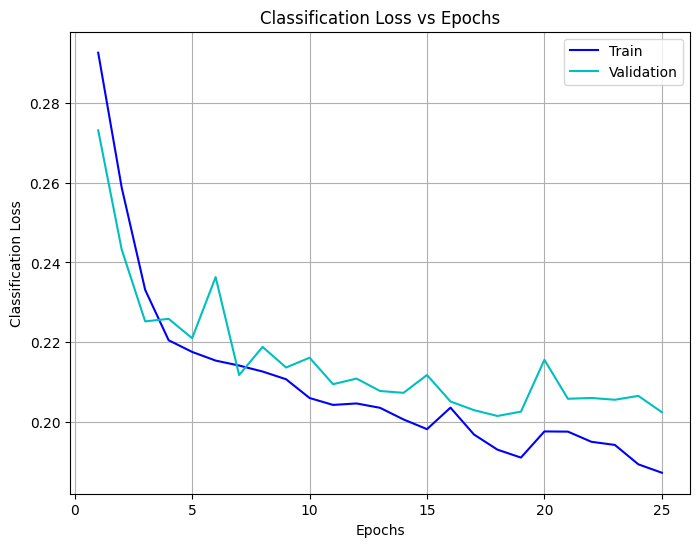

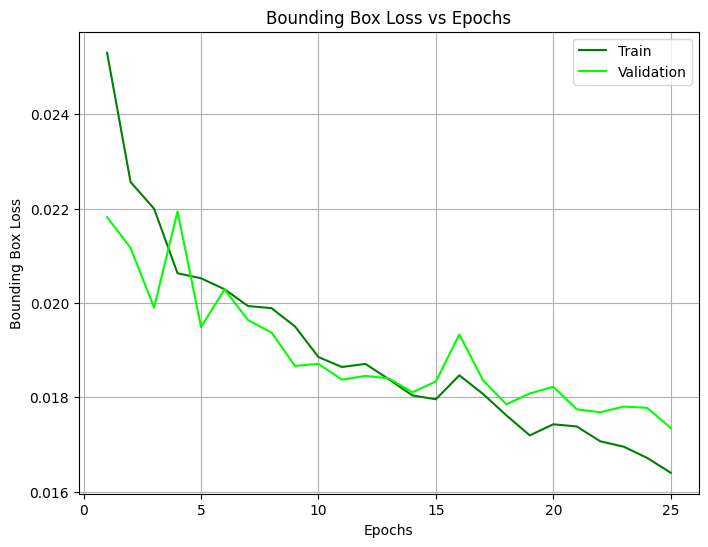

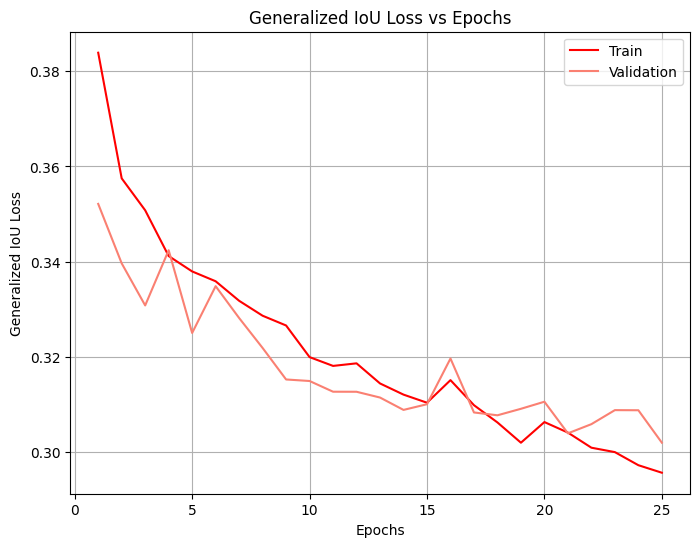

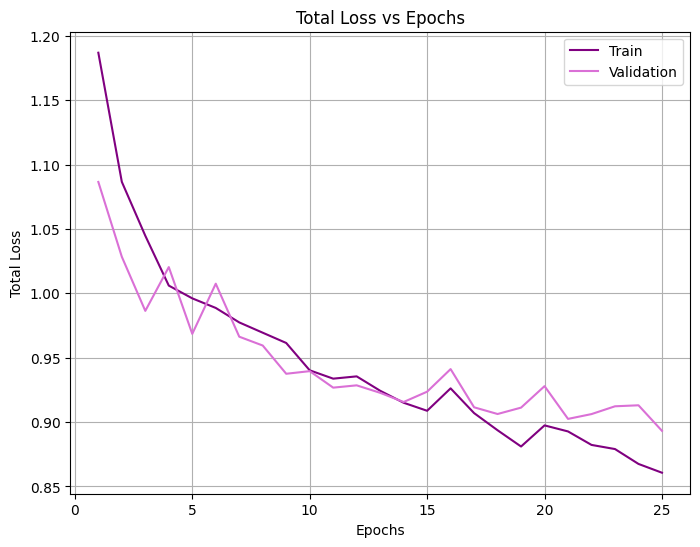

In [13]:
print("\n--- Training Phase ---")
train(model, train_loader, val_loader, optimizer, id_to_cat, num_epochs)

In [14]:
model_save_path_one = f"{model_save_dir}/model.pth"
model.load_state_dict(torch.load(model_save_path_one, map_location=device))
model = model.to(device)

/tmp/ipykernel_19/203308464.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path_one, map_location=device))



--- Evaluating on training set ---


Running inference:   0%|          | 0/1187 [00:00<?, ?it/s]

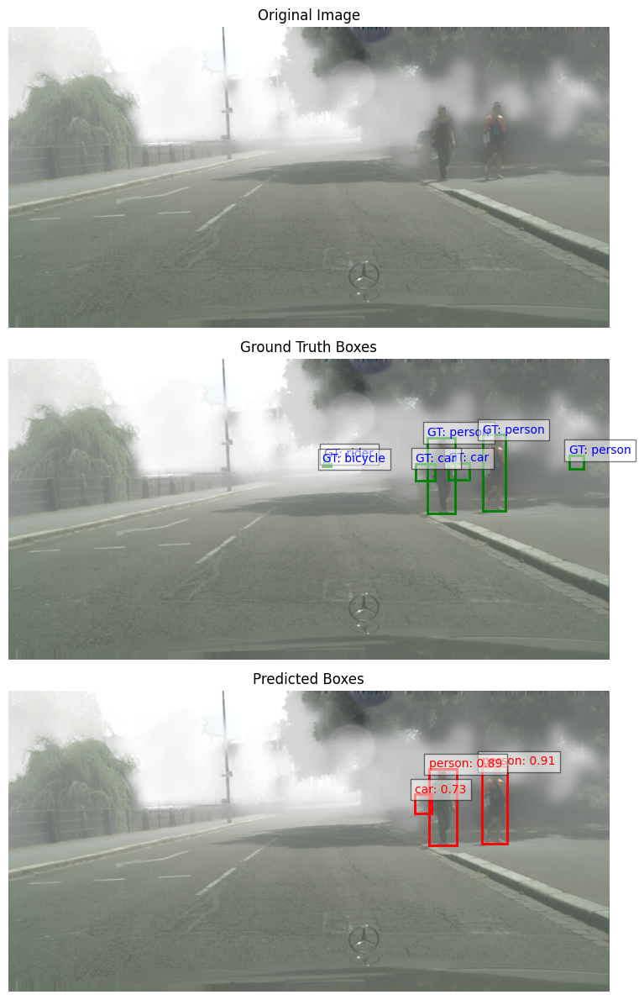

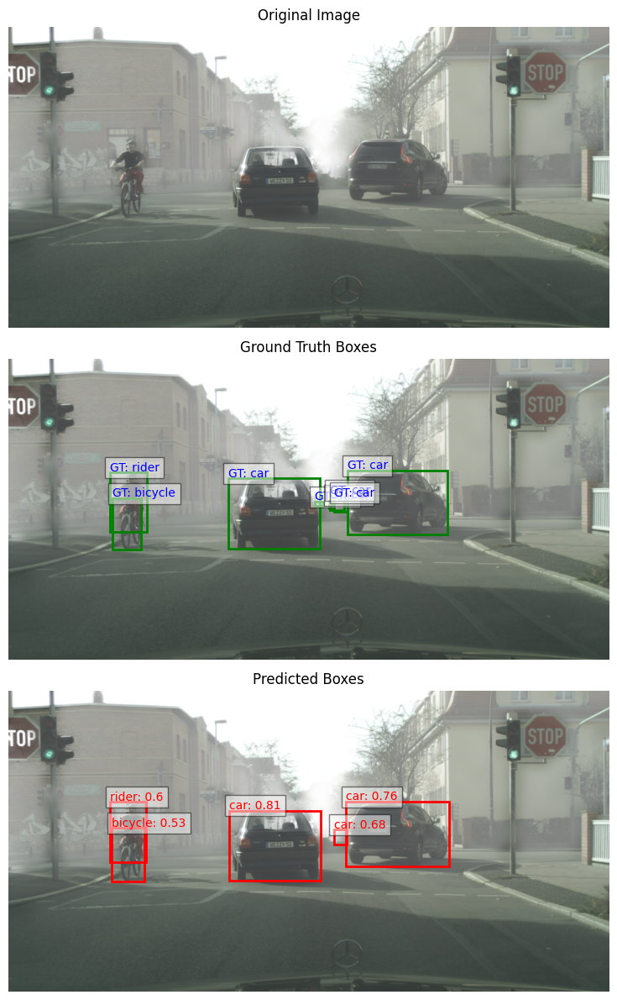

Running inference:   0%|          | 1/1187 [00:03<1:02:58,  3.19s/it]

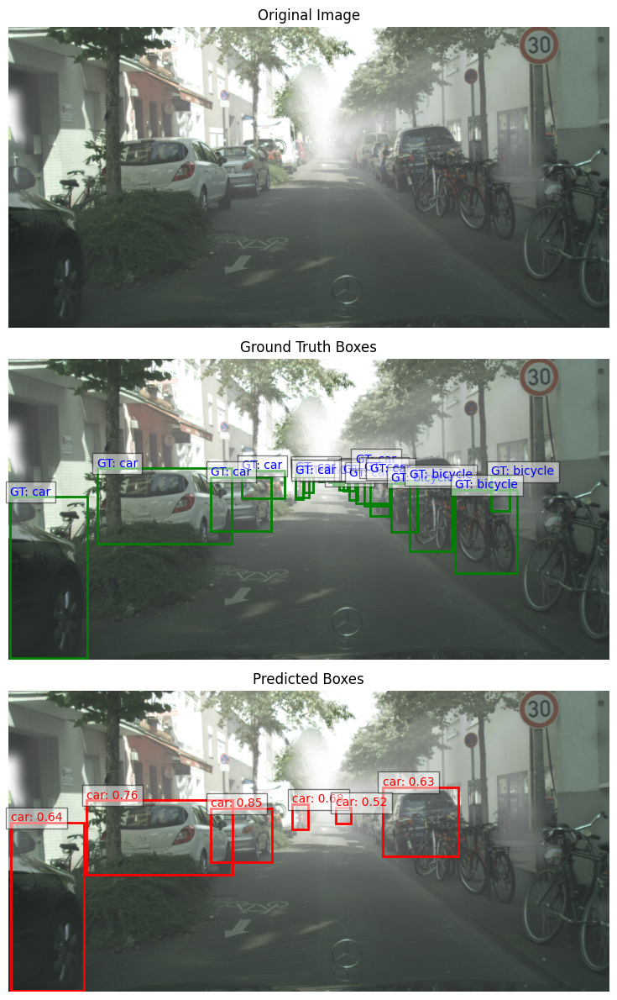

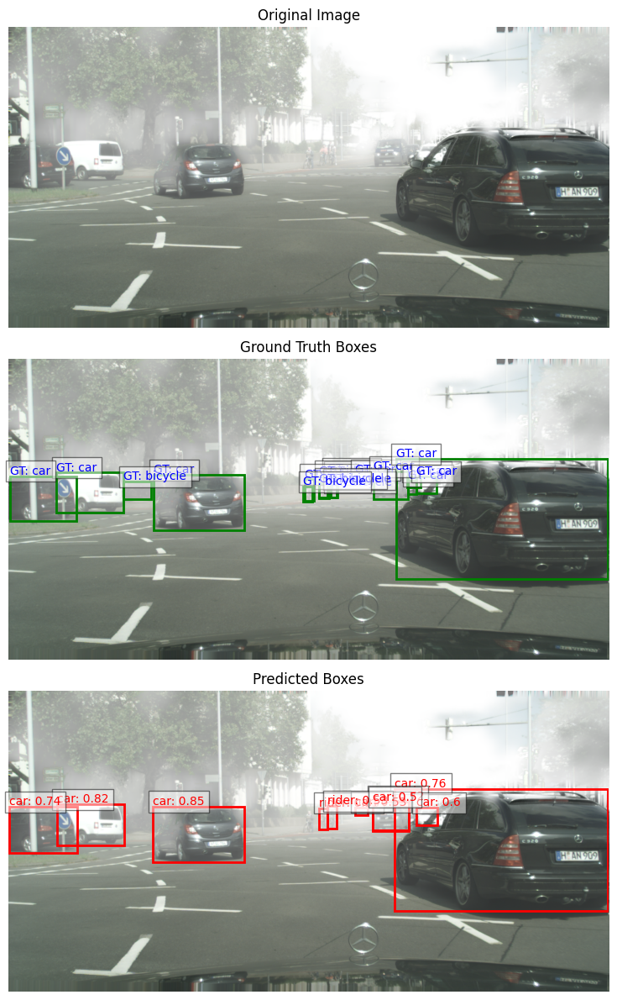

Running inference: 100%|██████████| 1187/1187 [11:38<00:00,  1.70it/s]


In [15]:
print("\n--- Evaluating on training set ---")
train_save_path = "train_predictions.json"
model.eval()
with torch.no_grad():
    train_eval = inference(model, train_loader, processor, id_to_cat, train_save_path)

Loading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=5.53s).
Accumulating evaluation results...
DONE (t=0.54s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.226
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.304
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.188
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.501
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.161
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.244
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.5

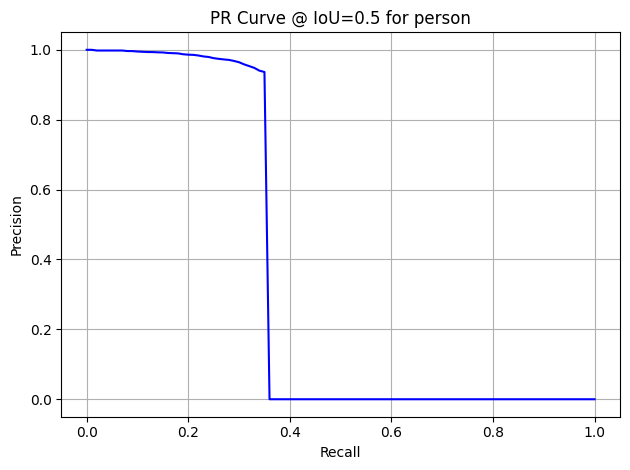

car                  | AP@0.5: 0.518 | AP@0.75: 0.464 | mAP@[.5:.95]: 0.414


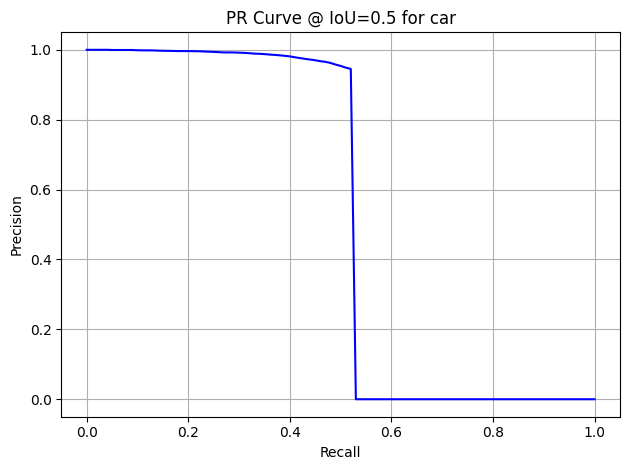

train                | AP@0.5: 0.335 | AP@0.75: 0.269 | mAP@[.5:.95]: 0.249


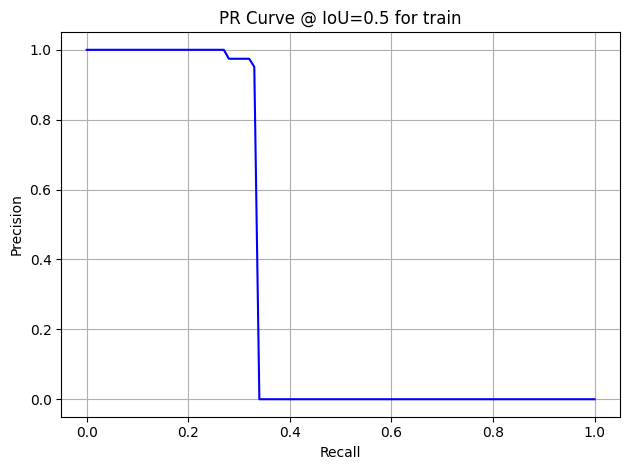

rider                | AP@0.5: 0.279 | AP@0.75: 0.230 | mAP@[.5:.95]: 0.195


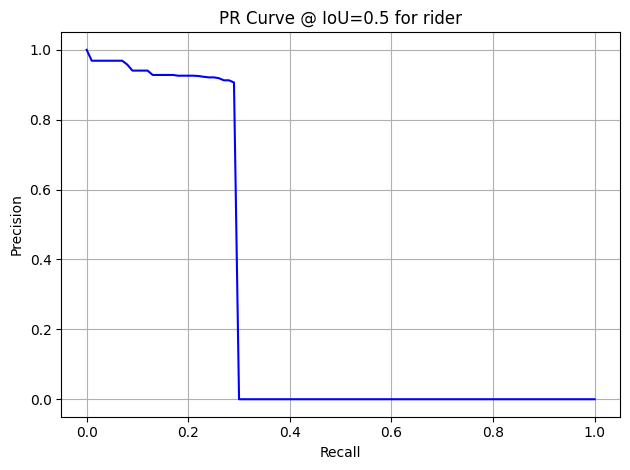

truck                | AP@0.5: 0.107 | AP@0.75: 0.106 | mAP@[.5:.95]: 0.097


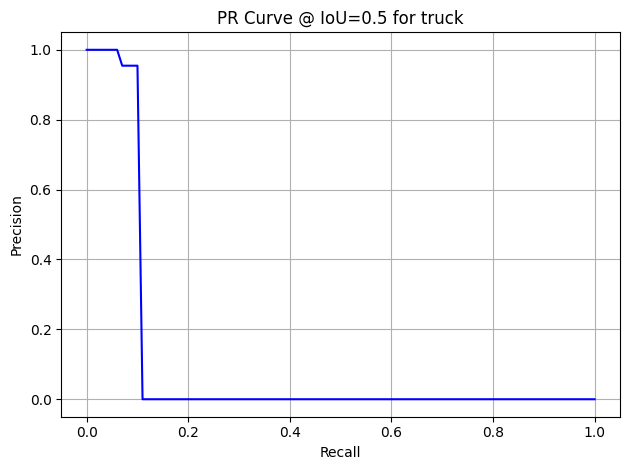

motorcycle           | AP@0.5: 0.235 | AP@0.75: 0.167 | mAP@[.5:.95]: 0.152


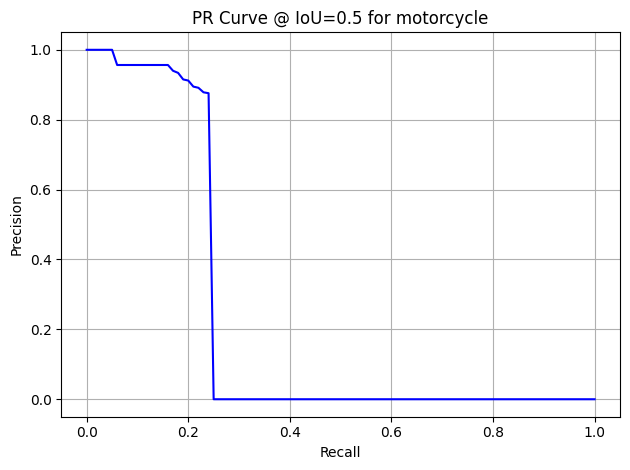

bicycle              | AP@0.5: 0.215 | AP@0.75: 0.130 | mAP@[.5:.95]: 0.124


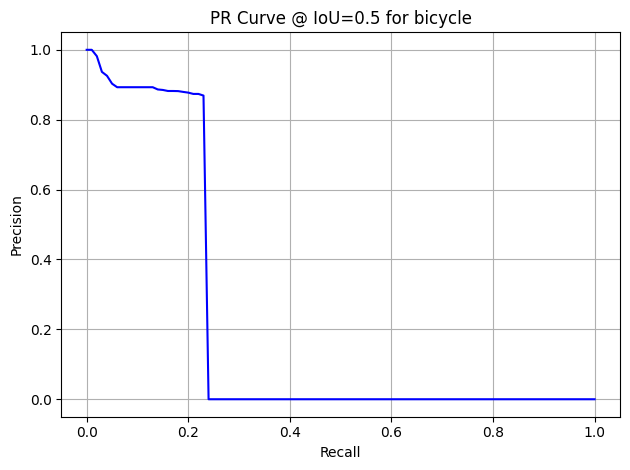

bus                  | AP@0.5: 0.394 | AP@0.75: 0.370 | mAP@[.5:.95]: 0.331


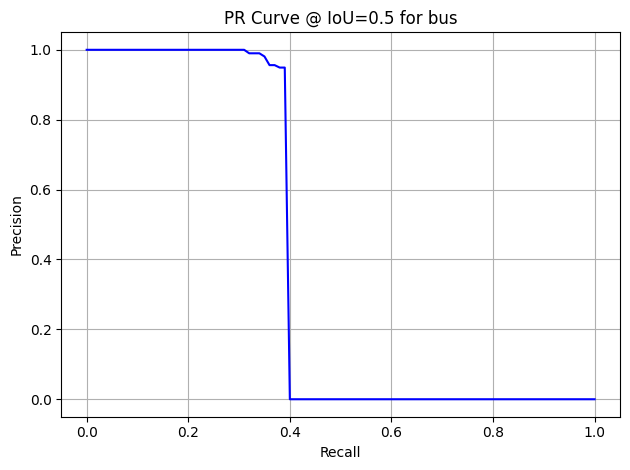

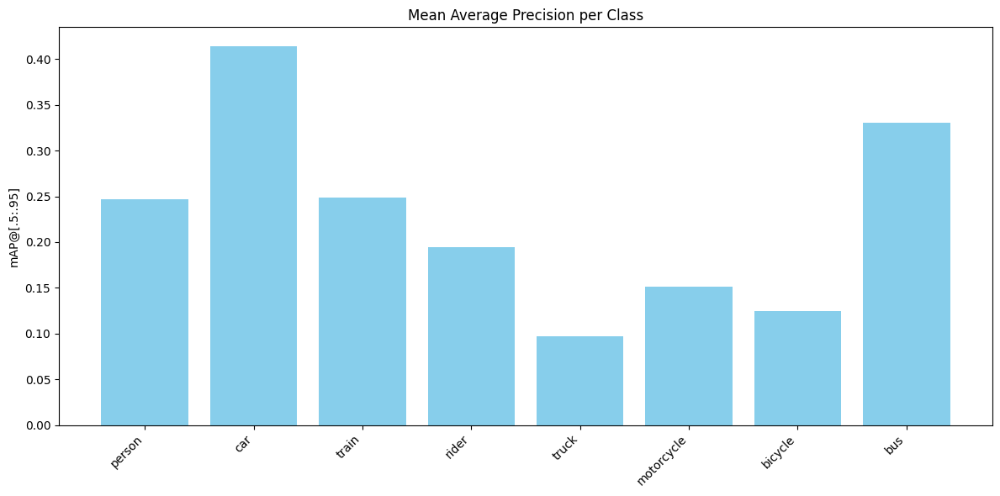

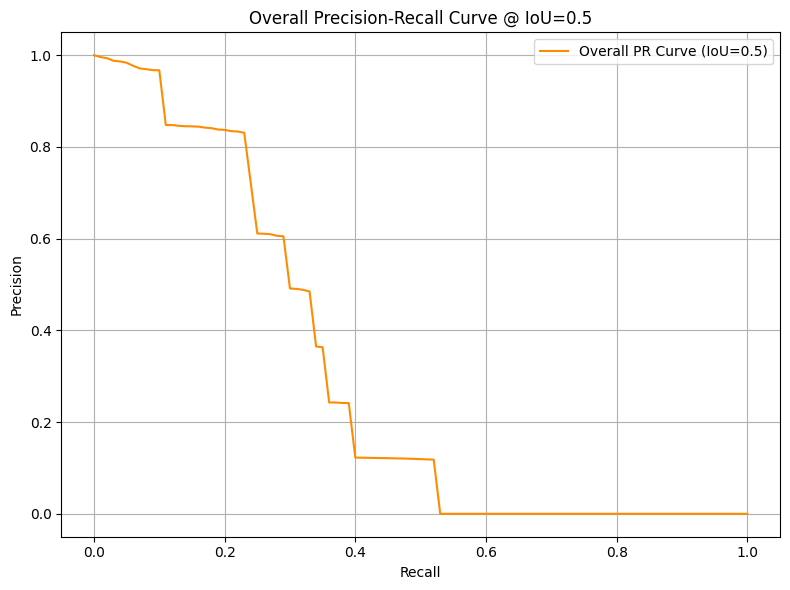

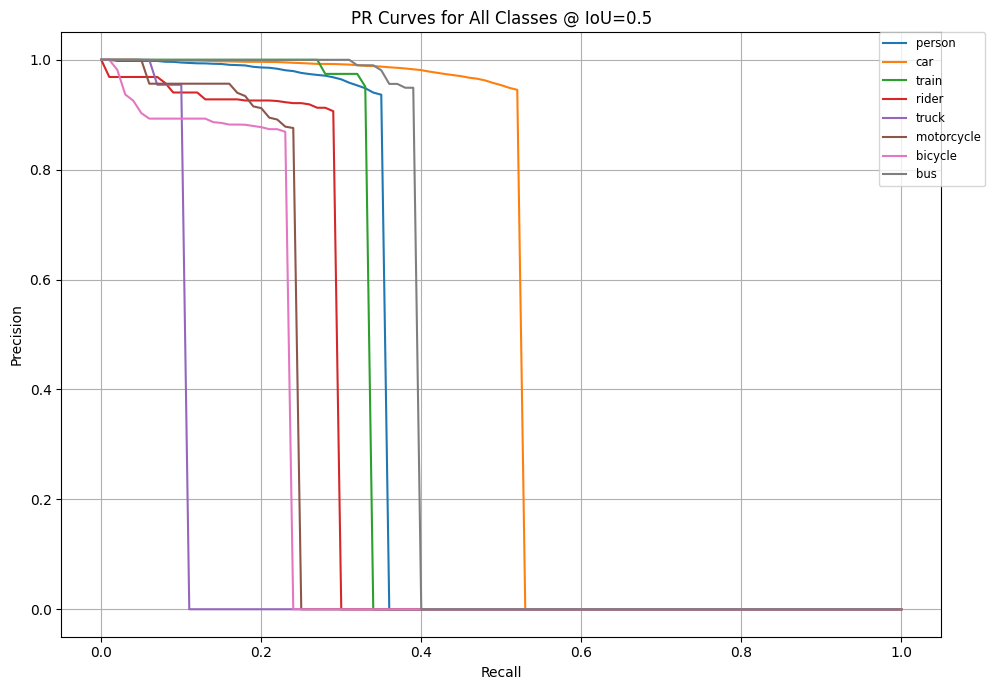

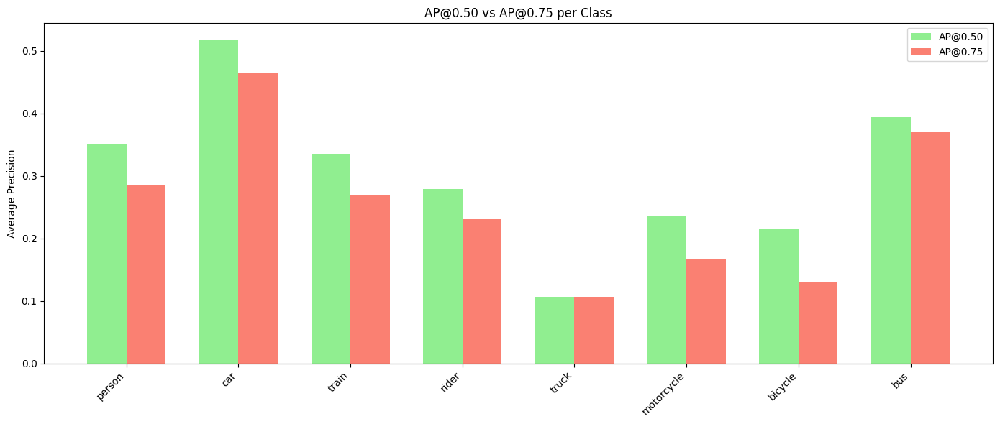

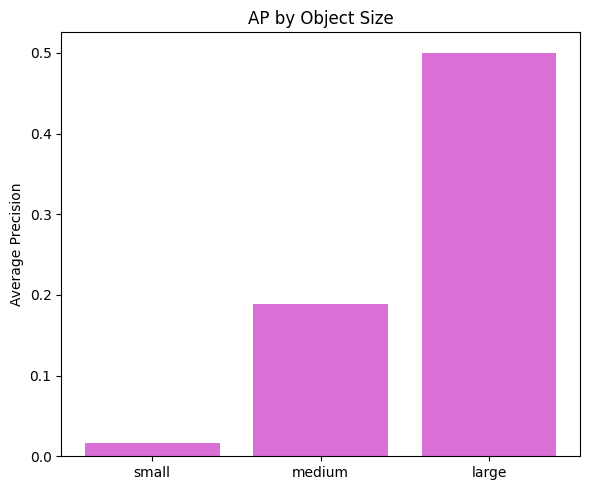

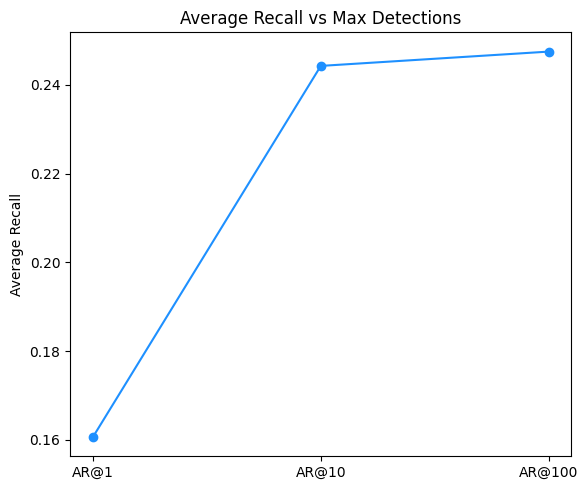


### Overall PR Curves at Multiple IoU Thresholds ###


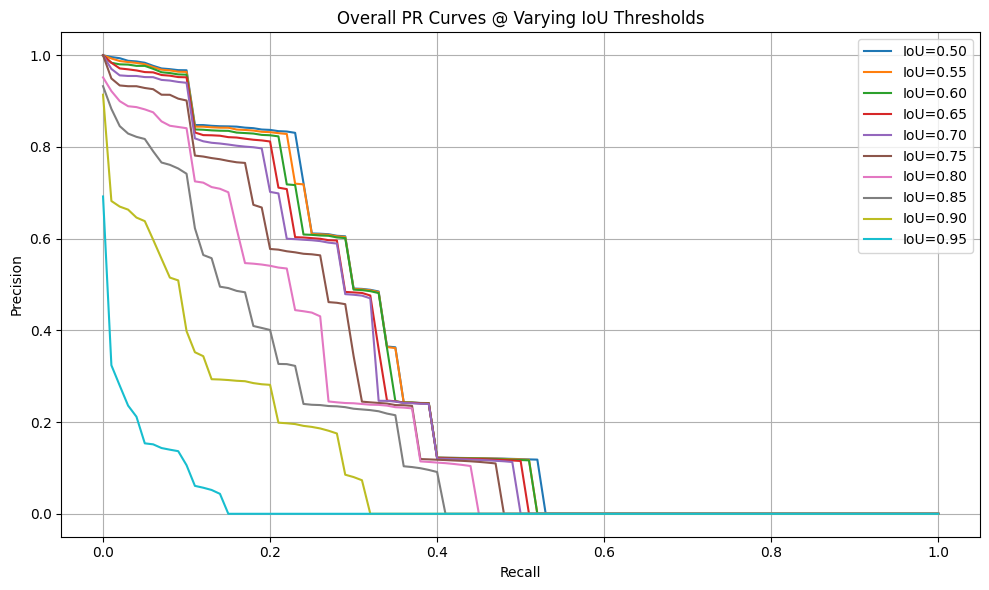

In [16]:
train_coco_pred = train_coco_gt.loadRes(train_save_path)
summarise_and_plot_metrics(train_coco_gt, train_coco_pred, "train_metrics")


--- Evaluating on validation set ---


Running inference:   0%|          | 0/301 [00:00<?, ?it/s]

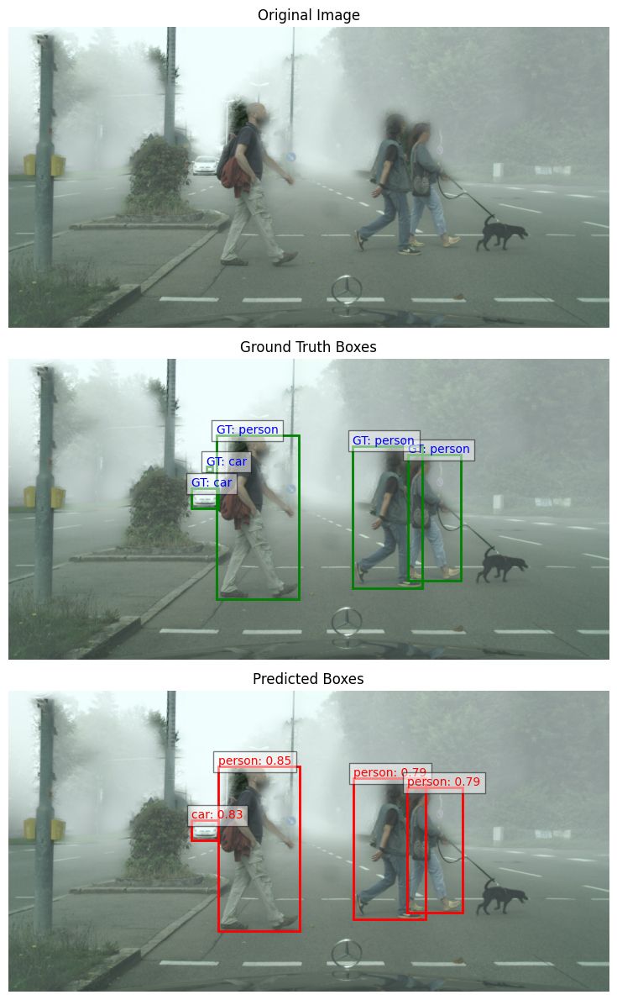

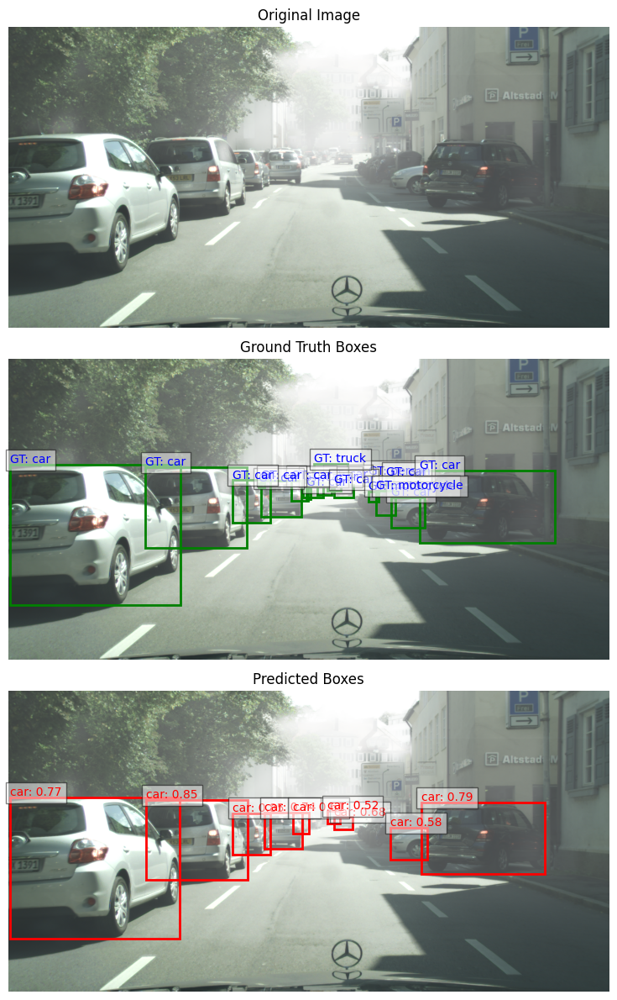

Running inference:   0%|          | 1/301 [00:03<15:23,  3.08s/it]

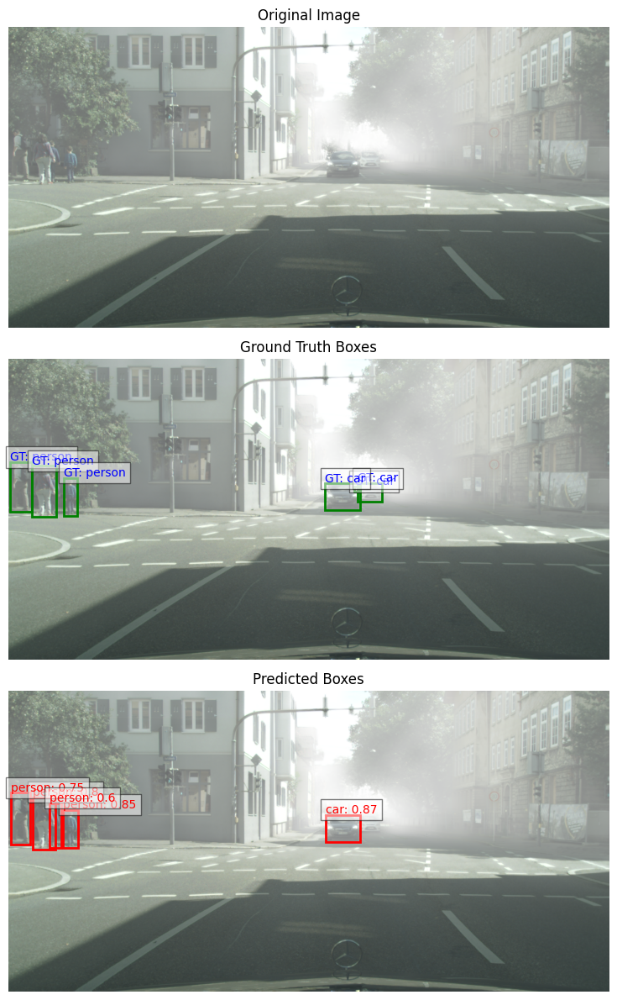

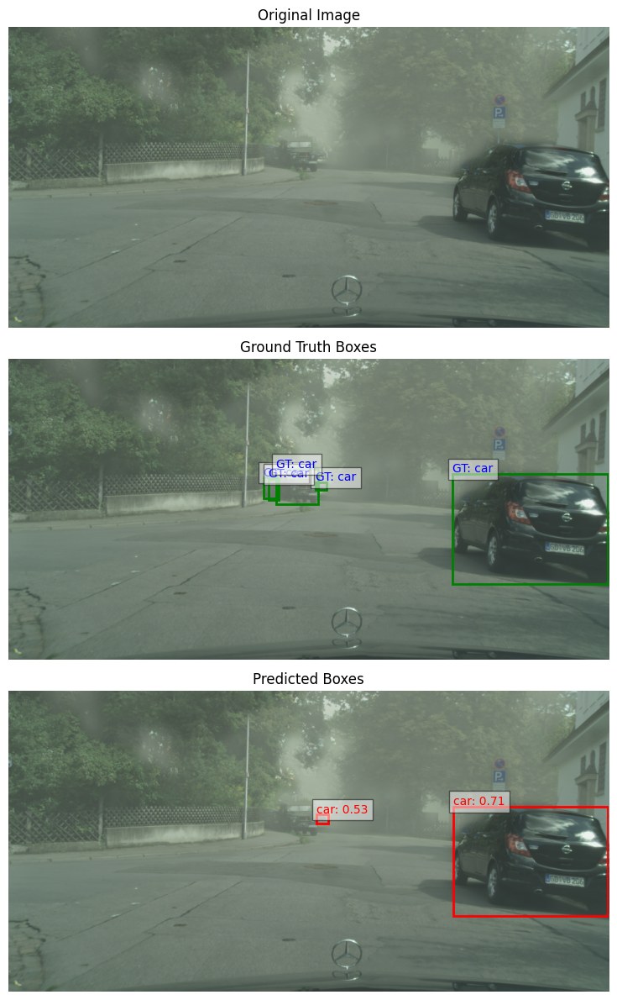

Running inference: 100%|██████████| 301/301 [02:59<00:00,  1.67it/s]


In [17]:
print("\n--- Evaluating on validation set ---")
val_save_path = "val_predictions.json"
model.eval()
with torch.no_grad():
    val_eval = inference(model, val_loader, processor, id_to_cat, val_save_path)

Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.41s).
Accumulating evaluation results...
DONE (t=0.16s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.180
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.254
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.195
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.013
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.170
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.413
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.124
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.201
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.205
 Average Recall     (AR) @[ IoU=0.5

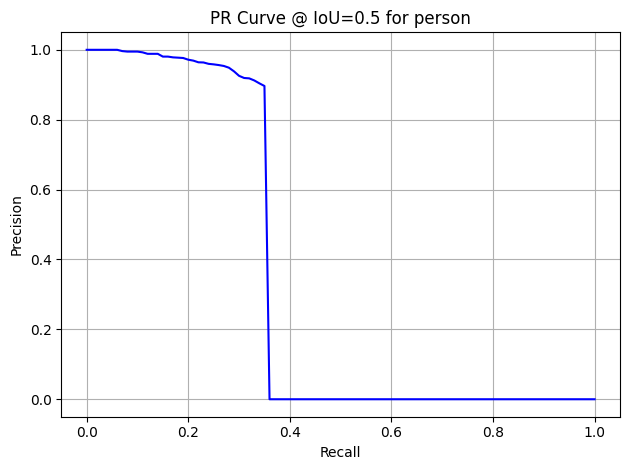

car                  | AP@0.5: 0.515 | AP@0.75: 0.470 | mAP@[.5:.95]: 0.413


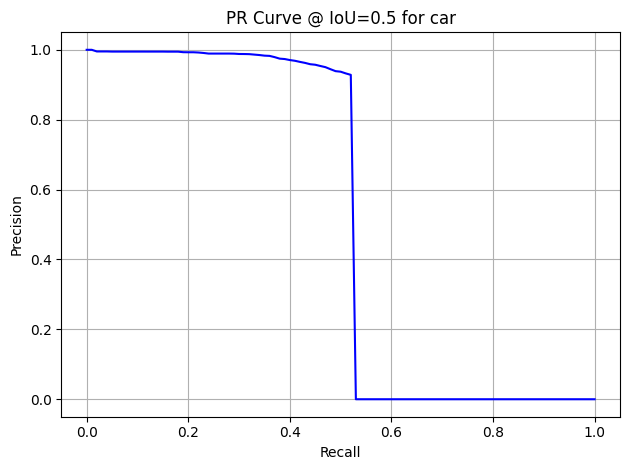

train                | AP@0.5: 0.160 | AP@0.75: 0.071 | mAP@[.5:.95]: 0.103


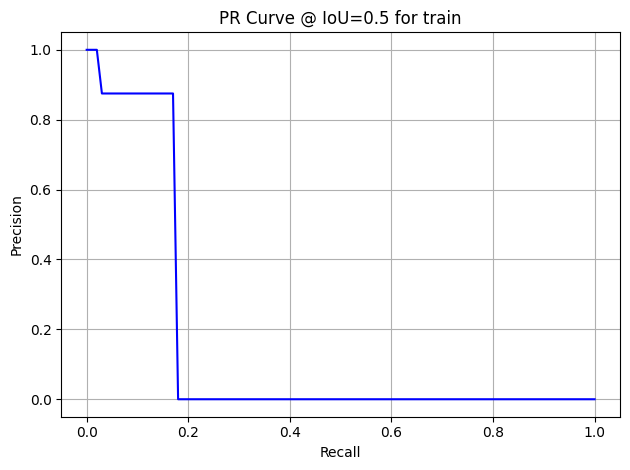

rider                | AP@0.5: 0.221 | AP@0.75: 0.159 | mAP@[.5:.95]: 0.137


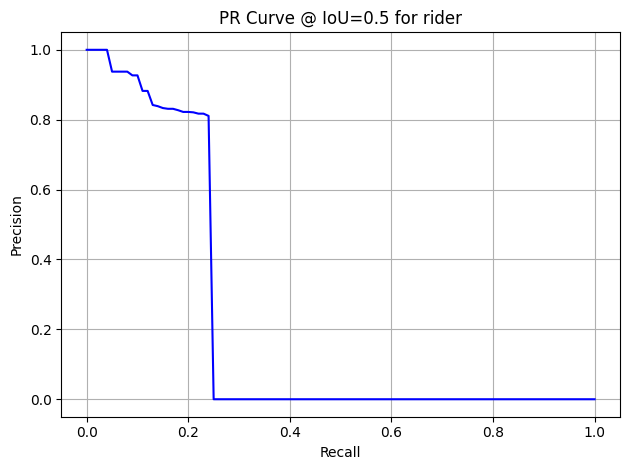

truck                | AP@0.5: 0.079 | AP@0.75: 0.079 | mAP@[.5:.95]: 0.064


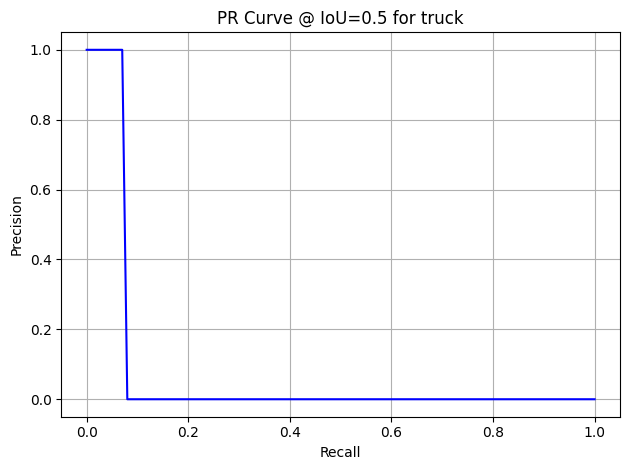

motorcycle           | AP@0.5: 0.234 | AP@0.75: 0.173 | mAP@[.5:.95]: 0.155


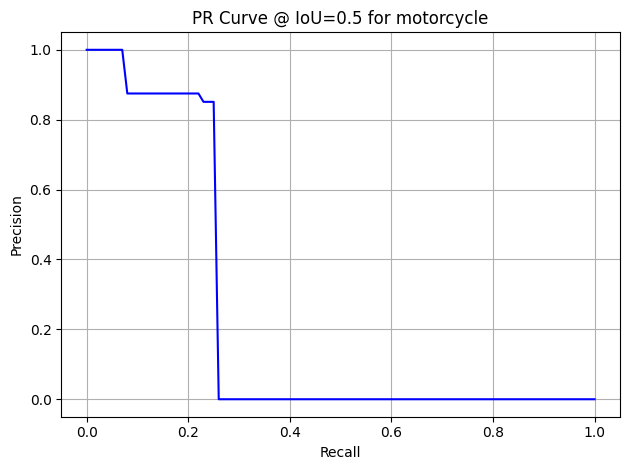

bicycle              | AP@0.5: 0.194 | AP@0.75: 0.069 | mAP@[.5:.95]: 0.096


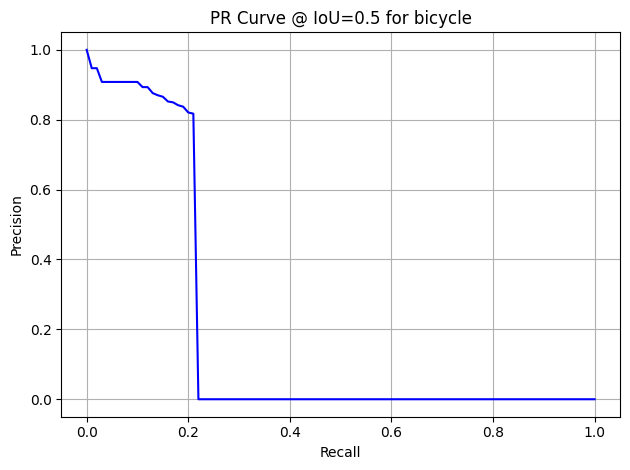

bus                  | AP@0.5: 0.281 | AP@0.75: 0.281 | mAP@[.5:.95]: 0.238


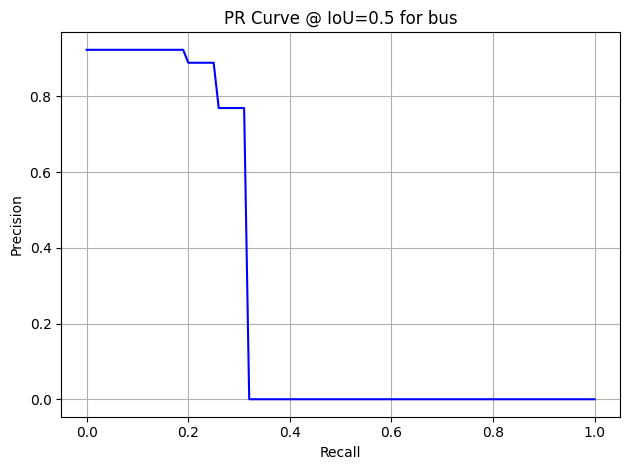

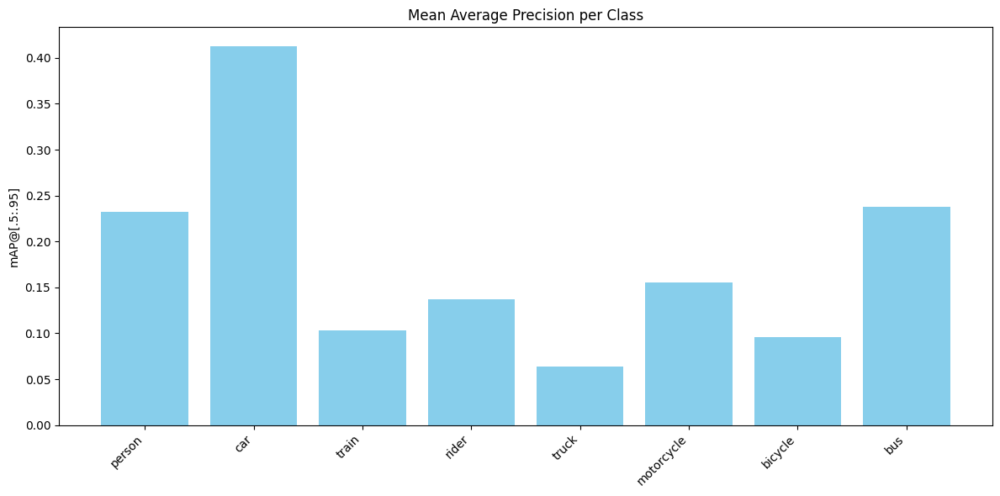

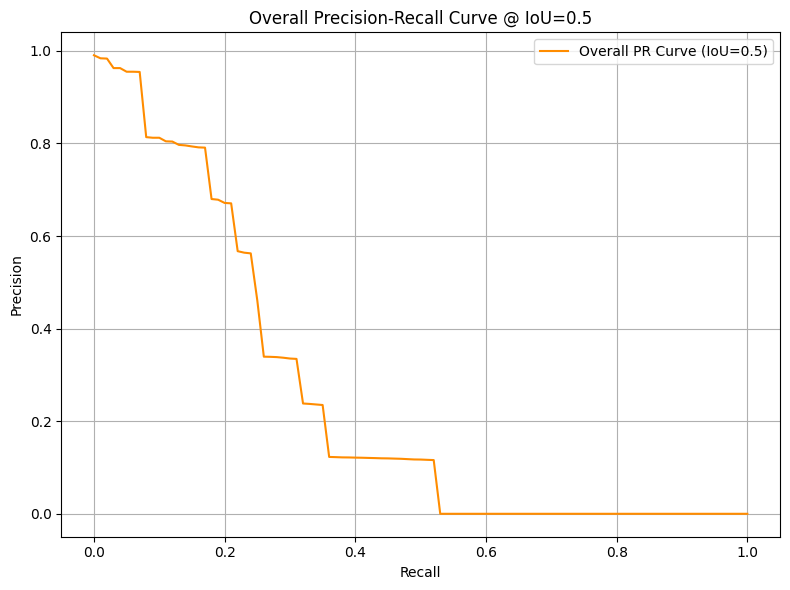

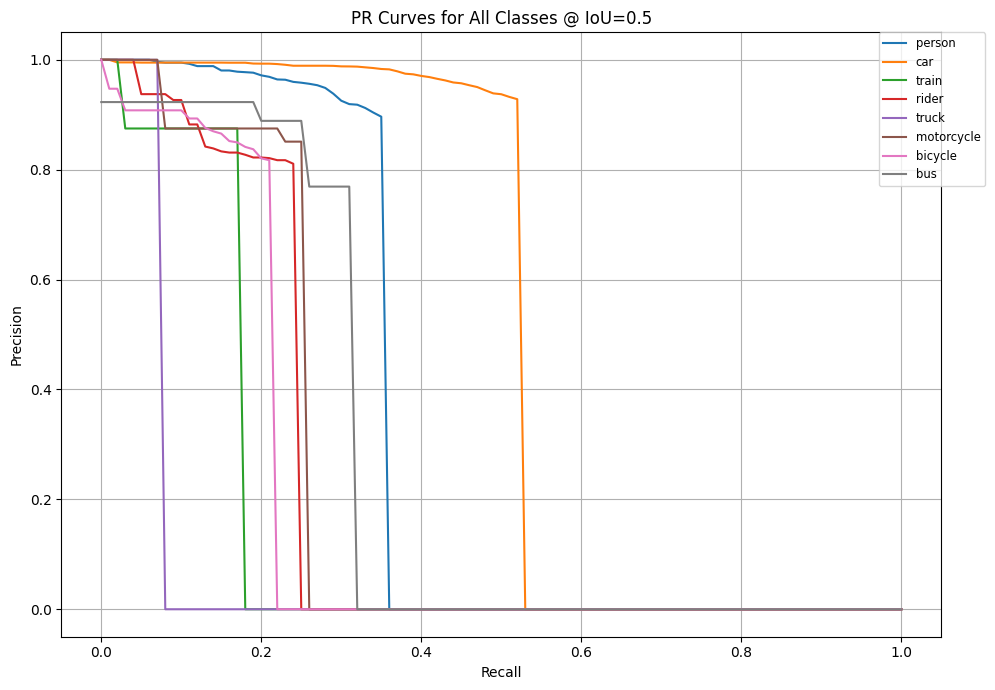

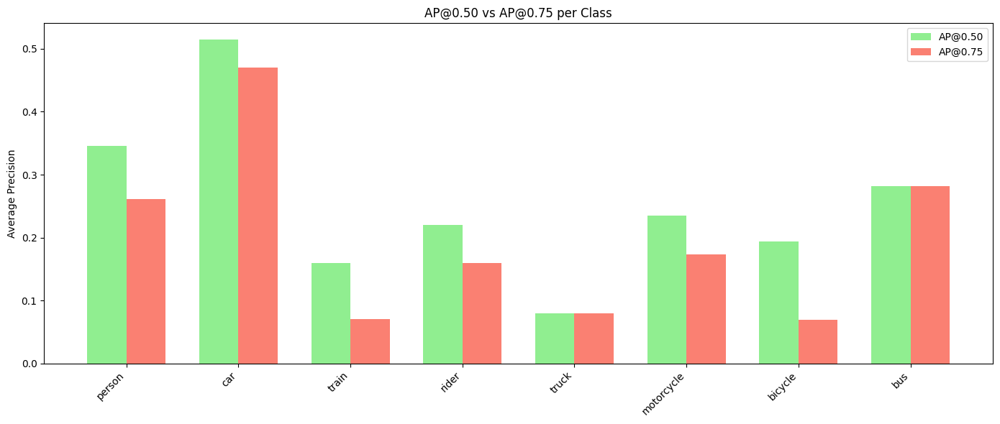

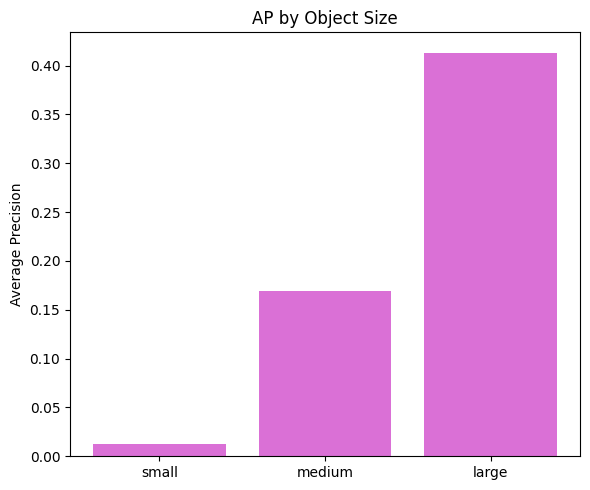

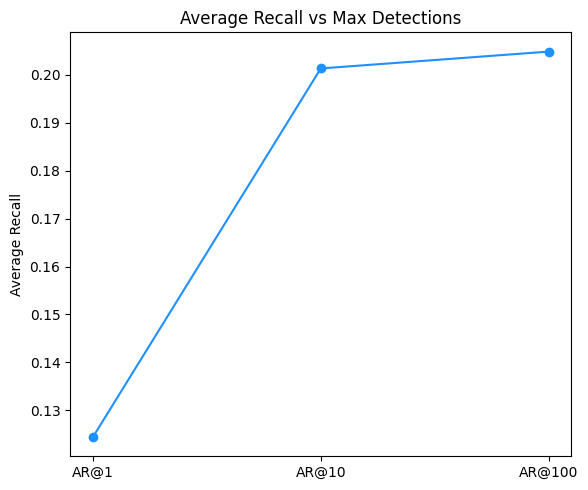


### Overall PR Curves at Multiple IoU Thresholds ###


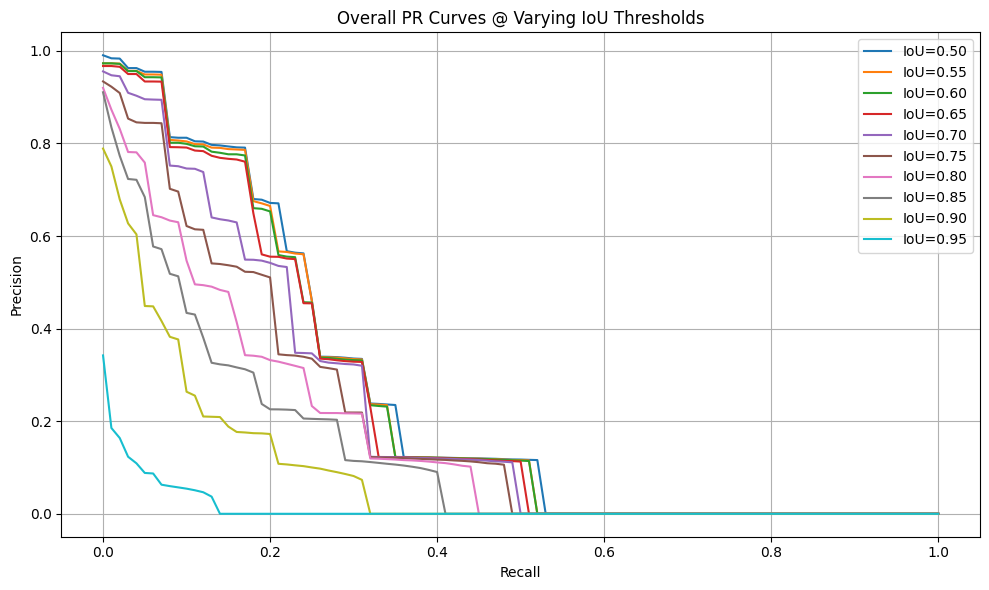

In [18]:
val_coco_pred = val_coco_gt.loadRes(val_save_path)
summarise_and_plot_metrics(val_coco_gt, val_coco_pred, "val_metrics")

In [19]:
print(model)

DeformableDetrForObjectDetection(
  (model): DeformableDetrModel(
    (backbone): DeformableDetrConvModel(
      (conv_encoder): DeformableDetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DeformableDetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DeformableDetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DeformableDetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3):